In [1]:
# function ClickConnect(){
#     console.log("Clicked on connect button"); 
#     document.querySelector("colab-connect-button").click()
# }
# setInterval(ClickConnect,60000)

In [1]:
#run once!!
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
import random
import copy
import datetime
import re
from collections import defaultdict
from heapq import *
# from google.colab import drive
import math
import numpy as np
import pickle
import requests
import os
today=datetime.date.today()

In [2]:
#関数パート
def pathtovalleyfree5(inPath,node):
  vtypestr=""
  path2=inPath+[node]
  # print(inPath,path2,"node",node)
  for i in range(len(path2)):
    try:
      vtypestr+=str(G.edges[[path2[i],path2[i+1]]]["vtype"])  
      # print("try")                    #エッジのｐｐｃｐｐｃの順番の文字列
    except:
      # print("exc")
      pass

  # print("vtystr:",vtypestr)
  if vtypestr.count("6")>1 or re.findall(".*4.*2.*",vtypestr) or re.findall(".*4.*6.*",vtypestr) or re.findall(".*6.*2.*",vtypestr):  #不可能な文字列だと
    return False 
  else:
    return True


def gdijkstra5(f):
    q, seen, mins = [(0,f,[])], set(), {f: [0,[f]]}
    seen.add(f)
    for v2 in list(G.neighbors(f)):
      c =G.edges[f,v2]["weight"]
      mins[v2] = [c,[f,v2]]
      heappush(q, (c, v2, [f]))
    while q:
      (cost,v1,path) = heappop(q)
      # print(cost,v1,path, q, seen, mins)
      if v1 not in seen:
          seen.add(v1)
          path3=path+[v1]
          # if len(mins)==G.number_of_nodes(): return sorted(mins)
          for v2 in list(G.neighbors(v1)):
              c =G.edges[v1,v2]["weight2"]
              # print("v1:",v1,"v2:",v2,c)
              if v2 in seen : continue
              prev = mins.get(v2, None)
              next = cost + c
              if (prev is None or next < prev[0]) and pathtovalleyfree5(path3,v2):
                  mins[v2] = [next,path3+[v2]]
                  heappush(q, (next, v2, path3))
    del mins[f]
    return mins

#導入率を受けとり、２パターンの導入率におけるダメージ量の属性を初期化、１パターン非導入２パターン非導入１２パたRPKI色
def dep_sta(rate):
  dep_AS=random.sample(node_list,int(len(node_list)*rate/100)) #ある導入率をもとにランダムに選出
  ndep_AS=[i for i in node_list if i not in dep_AS]
  
  top_dep_AS=[pair[0] for pair in sorted(list(G.degree()),reverse=True,key=lambda x:x[1])[0:int(len(node_list)*rate/100)]] #ある導入率をもとに次数順に選出
  top_ndep_AS=[i for i in node_list if i not in top_dep_AS]

  for AS in ndep_AS:
    G.nodes[AS]["rpki0"]="r"
    G.nodes[AS]["Cost0"]=0
    G.nodes[AS]['damage0']=0
  for AS in dep_AS:
    G.nodes[AS]["rpki0"]="b"
    G.nodes[AS]["Cost0"]= G.nodes[AS]['Costfixed']
    G.nodes[AS]['damage0']=0
  for AS in top_dep_AS:
    G.nodes[AS]["rpki1"]="b"
    G.nodes[AS]["Cost1"]=G.nodes[AS]['Costfixed']
    G.nodes[AS]['damage1']=0
  for AS in top_ndep_AS:
    G.nodes[AS]["rpki1"]="r"
    G.nodes[AS]["Cost1"]=0
    G.nodes[AS]['damage1']=0
   
  return (ndep_AS,top_ndep_AS,[G.nodes[AS]['rpki0'] for AS in node_list],[G.nodes[AS]['rpki1'] for AS in node_list],dep_AS,top_dep_AS) #ランダム選出AS、次数順選出AS、ランダム順色、次数順色

#導入率を受け取り、ダメージを受けるASを計算して、２パターンのダメージ量を返す
def ratio_damage(ratio):
  ndep=dep_sta(ratio)
  for i in [0,1]:
    #中間ASが導入していないことによりダメージを受けるODのペア
    damage_add=set()
    #0:ランダムにチョイスする 1:次数順に導入する
    for AS in ndep[i]:
      try:
        for od_pair_bymidAS in AS_OD_dic[AS]:
          damage_add.add(od_pair_bymidAS)
        for od_pair_byoriginal in OD_pair[AS]:
          damage_add.add(od_pair_byoriginal)
      except:
        pass
    for (origin,destination) in damage_add:
      G.nodes[origin]['damage'+str(i)]+= int(nx.degree(G)[origin]/2) * int(nx.degree(G)[destination]/2)
      G.nodes[destination]['damage'+str(i)]+=int(nx.degree(G)[destination]/2) * int(nx.degree(G)[origin]/2)

  return ([G.nodes[AS]['nodepDamage']-G.nodes[AS]['Brandparam']*G.nodes[AS]['damage0']- G.nodes[AS]['Cost0'] for AS in node_list],[G.nodes[AS]['nodepDamage']- G.nodes[AS]['Brandparam']*G.nodes[AS]['damage1'] - G.nodes[AS]['Cost1']for AS in node_list],ndep)#ランダム導入時の損得、次数導入時の損得、上記関数


#ASノード番号を受け取り、それだけ導入にしてそのASの損益値を得る
def ndepAS_benefitorloss(nodenum,ndeplist):
  for AS in node_list:
    G.nodes[AS]['hdamage']=0
  nl=copy.deepcopy(ndeplist)
  nl.remove(nodenum)
  hdamage_add=set()
  for AS in nl:
    try:
      for od_pair_bymidAS in AS_OD_dic[AS]:
        hdamage_add.add(od_pair_bymidAS)
      for od_pair_byoriginal in OD_pair[AS]:
        hdamage_add.add(od_pair_byoriginal)
    except:
      pass
  for (origin,destination) in hdamage_add:
    G.nodes[origin]['hdamage']+= int(nx.degree(G)[origin]/2) * int(nx.degree(G)[destination]/2)
    G.nodes[destination]['hdamage']+=int(nx.degree(G)[destination]/2) * int(nx.degree(G)[origin]/2)
  return G.nodes[nodenum]['nodepDamage']-G.nodes[nodenum]['hdamage']*G.nodes[AS]['Brandparam']



def LetsSimulate(RorD,nodeployASlist,deployASlist):
    
  for randomndepnode in nodeployASlist: 
    G.nodes[randomndepnode][f"Cost{RorD}"]=0
  for randomdepnode in deployASlist: 
    G.nodes[randomdepnode][f"Cost{RorD}"]=G.nodes[randomdepnode]['Costfixed']
    
  unk1list=[0,1,2,3,4,5]
  colorlist=[]
  benefitorlosslist=[G.nodes[AS]['nodepDamage']-G.nodes[AS][f'damage{RorD}']*G.nodes[AS]['Brandparam']- G.nodes[AS][f'Cost{RorD}'] for AS in node_list]
  path=f'/Users/odrag0n/Desktop/Dropbox/Data file/plots/{today}/{RorD},{cost},{rate}%,Cbp={Cbparam},Bbp={Bbparam}'
  if not os.path.exists(path):
        os.makedirs(path)
        
  while int(len([blue for blue in colorlist if blue=='b'])/len(node_list)) !=1 and not(unk1list[-1]==unk1list[-2] ==unk1list[-3]) and not(unk1list[-1]+unk1list[-2]==unk1list[-3]+unk1list[-4]==unk1list[-5]+unk1list[-6]): #導入が100％になるまで

    fN_tD_removelist=[] #導入、非導入に動くASのリスト
    for randomndepnode in nodeployASlist: #ランダム導入で導入していないAS 
      G.nodes[randomndepnode][f"rpki{RorD}"]="r"
      G.nodes[randomndepnode][f"Cost{RorD}"]=0
      G.nodes[randomndepnode][f'damage{RorD}']=0
      G.nodes[randomndepnode]['ifASChangedVal']=ndepAS_benefitorloss(randomndepnode,nodeployASlist)
      if benefitorlosslist[node_list.index(randomndepnode)] < G.nodes[randomndepnode]['ifASChangedVal'] - G.nodes[randomndepnode]['Costfixed']: #自分が導入すると#: #導入していないASで損益が〜を上回ると    
        print('ASischanged=',randomndepnode)
        print(benefitorlosslist[node_list.index(randomndepnode)],'<', G.nodes[randomndepnode]['ifASChangedVal'],'-' ,G.nodes[randomndepnode]['Costfixed'])
        fN_tD_removelist.append(randomndepnode)

#     fD_tN_removelist=[] #導入、非導入に動くASのリスト
    for randomdepnode in deployASlist: #ランダム導入で導入AS 
      G.nodes[randomdepnode][f"rpki{RorD}"]="b"
      G.nodes[randomdepnode][f"Cost{RorD}"]=G.nodes[randomdepnode]['Costfixed']
      G.nodes[randomdepnode][f'damage{RorD}']=0
      G.nodes[randomdepnode]['ifASChangedVal']=0


    damage_add=set()
    for AS in nodeployASlist:
        try:
          for od_pair_bymidAS in AS_OD_dic[AS]:
            damage_add.add(od_pair_bymidAS)
          for od_pair_byoriginal in OD_pair[AS]:
            damage_add.add(od_pair_byoriginal)
        except:
          pass
    for (origin,destination) in damage_add:
        G.nodes[origin][f'damage{RorD}']+= int(nx.degree(G)[origin]/2) * int(nx.degree(G)[destination]/2)
        G.nodes[destination][f'damage{RorD}']+=int(nx.degree(G)[destination]/2) * int(nx.degree(G)[origin]/2)
    
    benefitorlosslist=[G.nodes[AS]['nodepDamage']-G.nodes[AS][f'damage{RorD}']*G.nodes[AS]['Brandparam']- G.nodes[AS][f'Cost{RorD}'] for AS in node_list]
    benefitlistforplot=[G.nodes[AS]['nodepDamage']-G.nodes[AS][f'damage{RorD}']*G.nodes[AS]['Brandparam'] for AS in node_list]
    colorlist=[G.nodes[AS][f'rpki{RorD}'] for AS in node_list]
    
    unk1list.append(len([blue for blue in colorlist if blue=='b'])/50)
    print('----benefit----')
    print(benefitlistforplot)
    print('----nodepdamage----')
    print([G.nodes[i]['nodepDamage'] for i in node_list])
    print('----damage----')
    print([G.nodes[i][f'damage{RorD}']*G.nodes[i]['Brandparam'] for i in node_list])
    print('---estimated deployed benefit----')
    print([G.nodes[i]['ifASChangedVal'] for i in node_list])
    print('----cost----')
    print([G.nodes[i]['Costfixed'] for i in node_list])
    
    title=f'{rate}%->{int(100*unk1list[-1])}%,{len(node_list)}nodes,cp{cost},Cbp{Cbparam},Bbp{Bbparam},{RorD}'
    fig = plt.figure()
    plt.title(title)
    plt.xlabel('AS Index')
    plt.bar(list(range(len(node_list))),[G.nodes[AS]['ifASChangedVal'] for AS in node_list],color='r',alpha=0.3)
    plt.scatter(list(range(len(node_list))),benefitlistforplot,color=colorlist,marker="o",s=8)
    plt.plot(list(range(len(node_list))),[G.nodes[i]['Costfixed'] for i in node_list],color='orange',  linestyle='dashed')
    plt.show()
    fig.savefig(f'{path}/{title}.png')
    with open(f'{path}/{title}.binaryfile', 'wb') as web:
        pickle.dump([G.nodes[AS]['ifASChangedVal']  for AS in node_list]+benefitlistforplot+[G.nodes[i]['Costfixed'] for i in node_list], web)
   
    
    fig = plt.figure()
    plt.plot(list(range(len(node_list))),benefitorlosslist,color='blue', linestyle='dashdot')
    plt.title(f'benefit of each AS at {int(100*unk1list[-1])}%')
    plt.xlabel('AS Index')
    plt.show()
    fig.savefig(f'{path}/benefit of each AS at {int(100*unk1list[-1])}%.png')
    with open(f'{path}/benefit of each AS at {int(100*unk1list[-1])}%.binaryfile', 'wb') as web:
        pickle.dump(benefitorlosslist, web)
    
    fig=plt.figure()
    plt.plot(unk1list[6:])
    plt.xlabel('Shift')
    plt.title(f'Deployment rate, IDR={rate}%, cp{cost}, Cbp{Cbparam}, Bbp{Bbparam}, {RorD}')
    plt.ylim(0,1)
    plt.show()
    fig.savefig(f'{path}/{len(unk1list)-6}shift,({int(100*unk1list[-1])}%).png')
    with open(f'{path}/{len(unk1list)-6}shift,({int(100*unk1list[-1])}%).binaryfile', 'wb') as web:
        pickle.dump(unk1list[6:], web)
    
    plot_topology(title,path,RorD)

    for AS in fN_tD_removelist:
        nodeployASlist.remove(AS)
        deployASlist.append(AS)
  

def plot_topology(title,path,RorD):
  pos=nx.spring_layout(G) # positions for all nodes
  fig = plt.figure(figsize = (70, 50))

  nx.draw_networkx_nodes(G,pos,node_color=[G.nodes[i][f'rpki{RorD}'] for i in range(len(node_list))],node_size=800)
  nx.draw_networkx_edges(G,pos,width=1,alpha=0.5,edge_color='black')
  nx.draw_networkx_labels(G,pos,font_size=12,font_family='sans-serif')
  plt.show()
  fig.savefig(f'{path}/topo,{title[:7]}.png')



def linenotify(token,message):
        url = "https://notify-api.line.me/api/notify"
        headers = {"Authorization" : "Bearer "+ token}
        payload = {"message" :  message}
        r = requests.post(url ,headers = headers ,data=payload)

In [3]:
# H = nx.random_internet_as_graph(200,seed=None)
# G = nx.DiGraph(H)

In [4]:
# with open('/content/drive/MyDrive/Data file/Graph/nx_random_internet_as_Digraph.binaryfile', 'wb') as Graph:
#   pickle.dump(G , Graph)

In [12]:
with open('//Users/odrag0n//Desktop/Dropbox/Data file/nx_random_internet_as_Digraph.binaryfile', 'rb') as Graph:
  G = pickle.load(Graph)

In [13]:
node_list=sorted(list(G.nodes()), key=lambda x: nx.degree(G)[x],reverse=True)

for edge,ctdict in dict(G.edges).items():
  G.edges[edge]["weight2"]=1
  
  if ctdict["type"]=="transit":
    if str(edge[0])==ctdict["customer"]:
      G.edges[edge]["weight"]=2
      G.edges[edge]["vtype"]="2" 
    else:
      G.edges[edge]["weight"]=0 
      G.edges[edge]["vtype"]="4"
  else:
    G.edges[edge]["weight"]=1
    G.edges[edge]["vtype"]="6"

In [14]:
for node in node_list:
  G.nodes[node]['nodepDamage']=0
  
AS_OD_dic=defaultdict(list)
OD_pair=defaultdict(list)
#始点：node 終点：key
for node in node_list:
  for keys,values in gdijkstra5(node).items():
    #導入がゼロの時のダメージ量の最低を求める
    G.nodes[node]['nodepDamage']+=1 * int(nx.degree(G)[node]/2) * int(nx.degree(G)[keys]/2) 
    G.nodes[keys]['nodepDamage']+=1 * int(nx.degree(G)[node]/2) * int(nx.degree(G)[keys]/2) 
    #その始点ASと終点ASのペアを作る
    OD_pair[node].append((node,keys))
    OD_pair[node].append((keys,node))

    for i in values[1][1:-1]:
      AS_OD_dic[i].append((node,keys))


In [15]:
# cost=G.nodes[node_list[-1]]['nodepDamage'] /math.log(nx.degree(G)[node_list[-1]])-30
cost=300
rate = 27
Cbparam=2
Bbparam=0.5
if not os.path.exists(f'/Users/odrag0n/Desktop/Dropbox/Data file/plots/{today}'):
    os.makedirs(f'/Users/odrag0n/Desktop/Dropbox/Data file/plots/{today}')

In [16]:
for node in node_list:
    G.nodes[node]['Costfixed']=cost*(1+Cbparam*np.random.randn())*math.log(nx.degree(G)[node])
    G.nodes[node]['Brandparam']=Bbparam*np.random.randn()+1
    G.nodes[node]['nodepDamage']=G.nodes[node]['Brandparam']*G.nodes[node]['nodepDamage']

In [17]:
damage_list=ratio_damage(rate)
# [0]ランダム導入時の損得
# [1]次数導入時の損得
# [2]上記関数
#   [0]ランダム非導入AS
#   [1]次数順非導入AS
#   [2]ランダム順色
#   [3]次数順色
#   [4]ランダム導入AS
#   [5]次数順導入AS
# plt.scatter(list(range(len(node_list))),damage_list[0],color=damage_list[2][2],s=8)
# plt.show()
# plt.scatter(list(range(len(node_list))),damage_list[1],color=damage_list[2][3],s=8)
# plt.show()

ASischanged= 14
0.0 < 253.44754432054333 - -1468.6177474943752
ASischanged= 22
0.0 < 194.3935859679155 - -343.89569923334153
ASischanged= 23
0.0 < 158.7220125435594 - -179.98054059857543
ASischanged= 24
0.0 < 112.72754468410405 - 83.00818058708651
ASischanged= 25
0.0 < 179.30715397894716 - 76.33762326408866
ASischanged= 26
0.0 < 153.54346287723655 - 140.38835993653623
ASischanged= 29
0.0 < 95.81740108501198 - -146.35936885468098
ASischanged= 30
0.0 < 427.11417969604025 - 181.83686335008034
ASischanged= 33
0.0 < 334.2369317153071 - 312.12882683342303
ASischanged= 36
0.0 < 217.8174066785425 - -323.7139538375466
ASischanged= 37
0.0 < 279.26574339749436 - -672.9877435503429
ASischanged= 38
0.0 < 264.1764125721737 - -361.0167997845107
ASischanged= 40
0.0 < 129.75484289354455 - -99.7281444081628
ASischanged= 41
0.0 < 51.66046225398351 - -512.4887328028265
ASischanged= 43
0.0 < 159.38420623172328 - 69.98580995095683
ASischanged= 46
0.0 < 174.39813525783535 - -276.34769490070136
ASischanged= 4

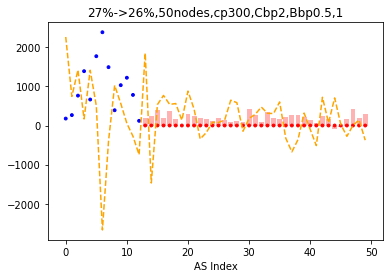

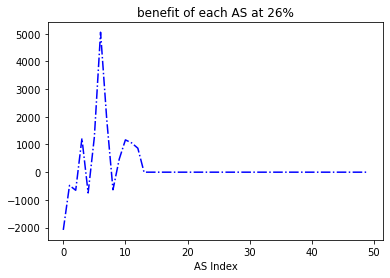

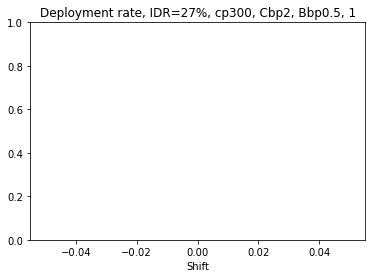

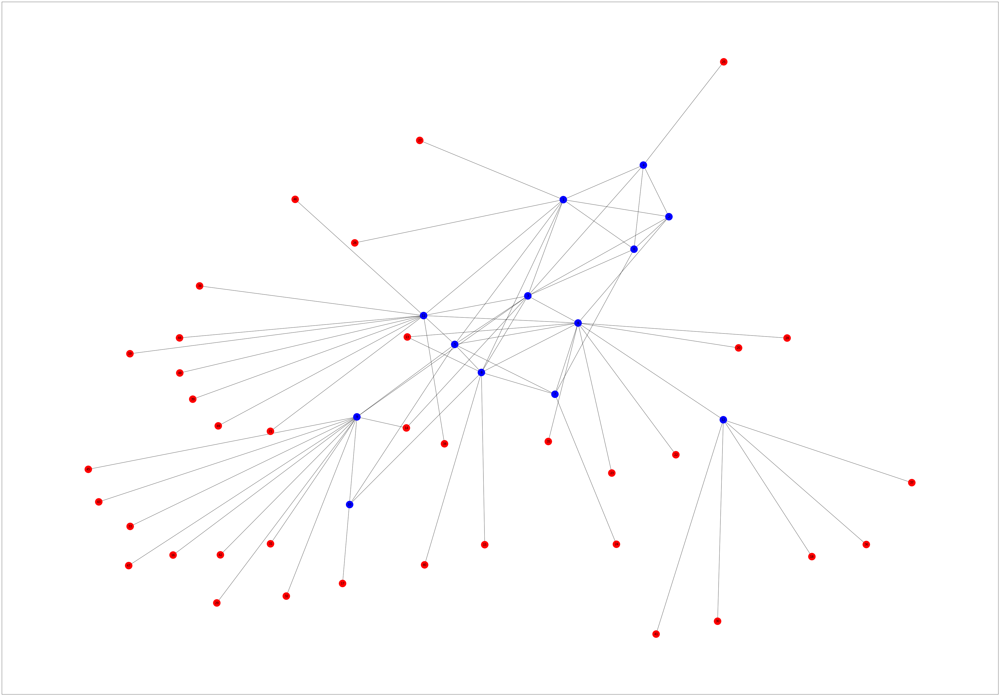

ASischanged= 31
0.0 < 360.6560557583339 - 283.93863109671
ASischanged= 39
0.0 < 319.189366608073 - 317.4316489587293
ASischanged= 45
0.0 < 49.66776603141062 - 30.43522795142657
----benefit----
[216.96209578696244, 325.10546890766415, 933.6722331621096, 1686.400986324108, 805.2454372779923, 2147.32922520661, 2885.0647670631397, 1798.4780561047442, 469.62575967715446, 1240.8351133132553, 1469.860892521345, 941.5298906980217, 143.58095705868095, 0.0, 384.499592422926, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 253.25336224597942, 222.38859658802593, 182.5919648231071, 240.19985371651745, 217.90786567106574, 0.0, 0.0, 167.9604930565168, 454.61444334407315, 0.0, 0.0, 374.2525692047154, 0.0, 0.0, 273.52078158425246, 326.6888459793739, 313.6328292368979, 0.0, 197.32480440858046, 129.7537800254142, 0.0, 222.96155850260743, 0.0, 0.0, 235.95233397200937, 456.32733418699524, 243.2989068343805, 315.59754180519496]
----nodepdamage----
[254.43736687743777, 381.2600499008061, 1094.942891617383, 1969.95513446

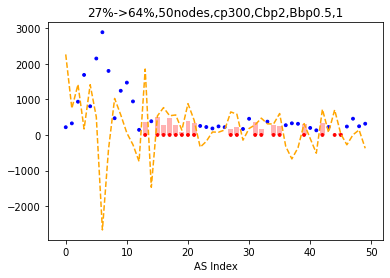

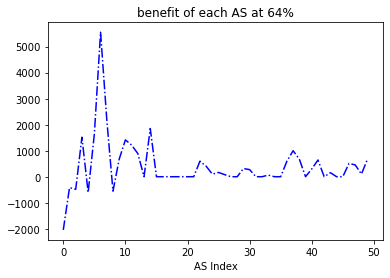

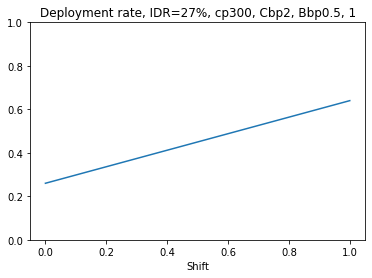

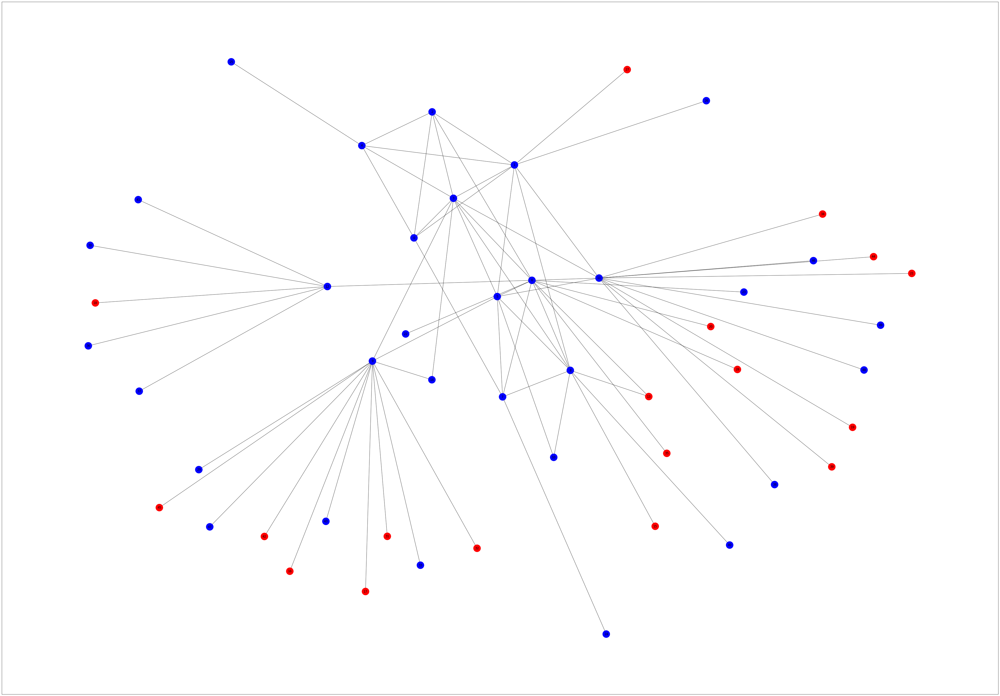

----benefit----
[222.8792438538796, 333.97198169605497, 959.136021339258, 1731.172693925633, 826.4361066800448, 2203.837889027837, 2960.3273262039174, 1844.592878056148, 481.5653976350482, 1272.3817687364735, 1507.230237246464, 965.4670913089885, 147.14081549815236, 0.0, 394.032640168949, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 259.4809039405527, 227.85716863527247, 187.0819311712163, 246.1064074964318, 223.2662558105182, 0.0, 0.0, 172.09066911528362, 465.7934870328619, 325.5039338225376, 0.0, 383.4555012343396, 0.0, 0.0, 280.2467024428816, 334.72217825755524, 321.3451119230511, 288.74268457585237, 202.17705369731604, 132.94444674735058, 0.0, 228.4442197772617, 0.0, 45.224872177003306, 241.75444054509157, 467.5484981424131, 249.28166683850458, 323.35813709548665]
----nodepdamage----
[254.43736687743777, 381.2600499008061, 1094.942891617383, 1969.9551344670997, 939.4530101576578, 2505.2174294077117, 3361.7276416213977, 2090.538595130301, 545.2434667438149, 1440.6305976603048, 1706.5334091137

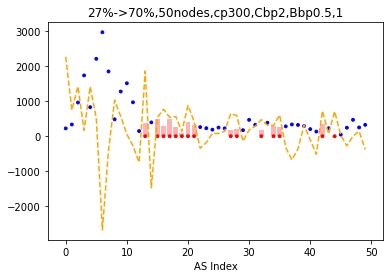

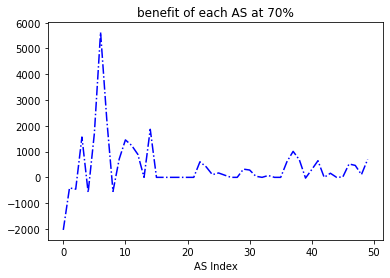

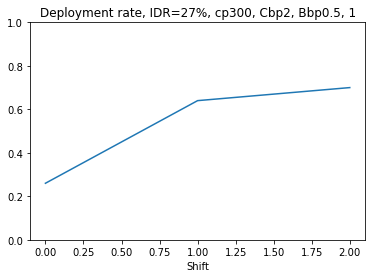

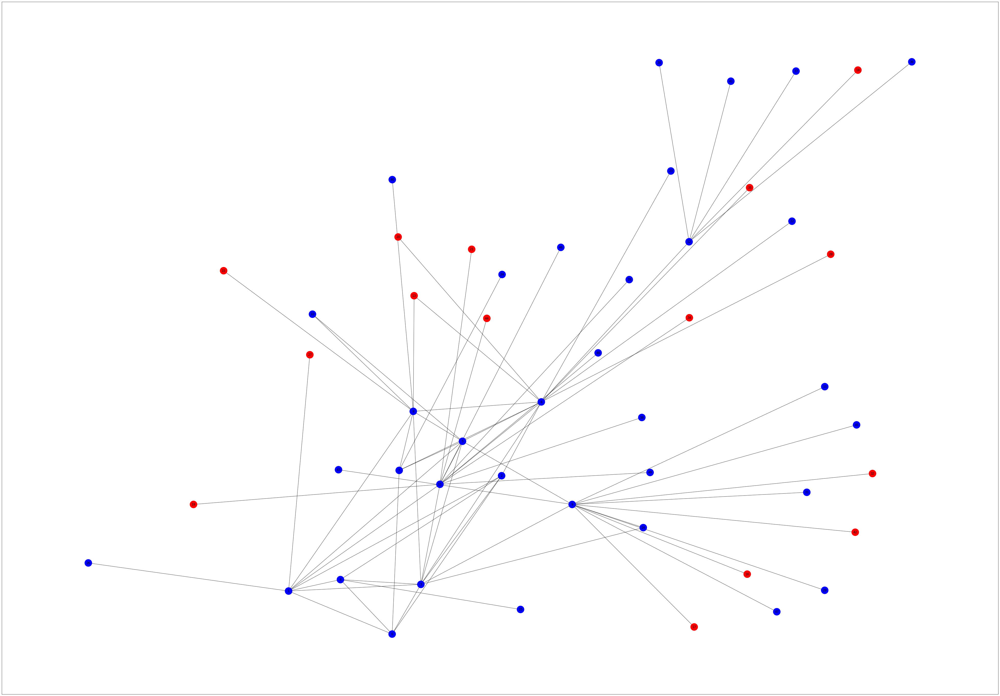

----benefit----
[222.8792438538796, 333.97198169605497, 959.136021339258, 1731.172693925633, 826.4361066800448, 2203.837889027837, 2960.3273262039174, 1844.592878056148, 481.5653976350482, 1272.3817687364735, 1507.230237246464, 965.4670913089885, 147.14081549815236, 0.0, 394.032640168949, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 259.4809039405527, 227.85716863527247, 187.0819311712163, 246.1064074964318, 223.2662558105182, 0.0, 0.0, 172.09066911528362, 465.7934870328619, 325.5039338225376, 0.0, 383.4555012343396, 0.0, 0.0, 280.2467024428816, 334.72217825755524, 321.3451119230511, 288.74268457585237, 202.17705369731604, 132.94444674735058, 0.0, 228.4442197772617, 0.0, 45.224872177003306, 241.75444054509157, 467.5484981424131, 249.28166683850458, 323.35813709548665]
----nodepdamage----
[254.43736687743777, 381.2600499008061, 1094.942891617383, 1969.9551344670997, 939.4530101576578, 2505.2174294077117, 3361.7276416213977, 2090.538595130301, 545.2434667438149, 1440.6305976603048, 1706.5334091137

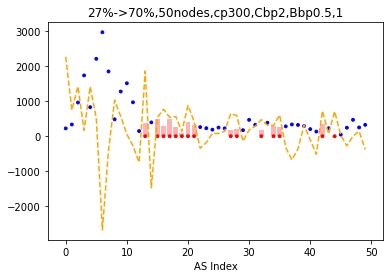

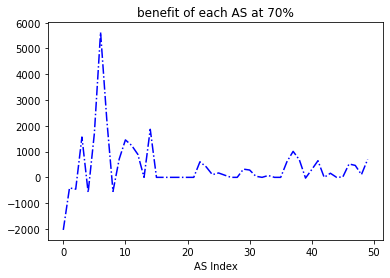

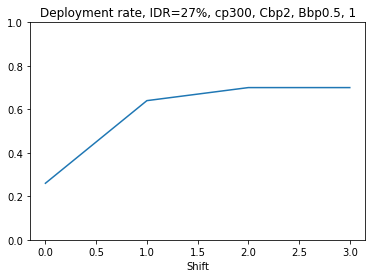

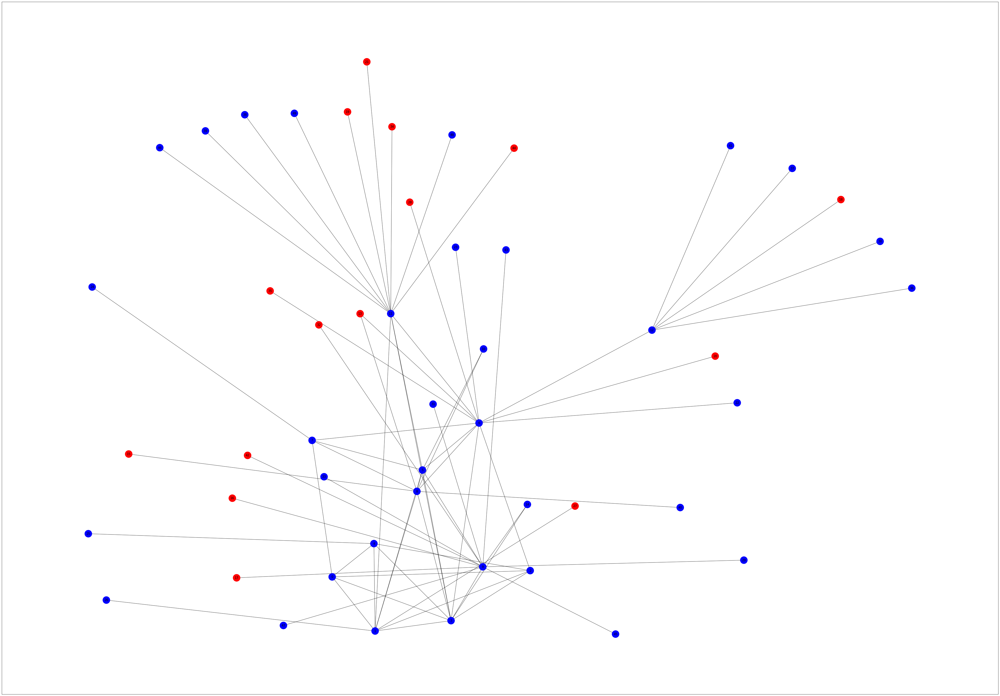

----benefit----
[222.8792438538796, 333.97198169605497, 959.136021339258, 1731.172693925633, 826.4361066800448, 2203.837889027837, 2960.3273262039174, 1844.592878056148, 481.5653976350482, 1272.3817687364735, 1507.230237246464, 965.4670913089885, 147.14081549815236, 0.0, 394.032640168949, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 259.4809039405527, 227.85716863527247, 187.0819311712163, 246.1064074964318, 223.2662558105182, 0.0, 0.0, 172.09066911528362, 465.7934870328619, 325.5039338225376, 0.0, 383.4555012343396, 0.0, 0.0, 280.2467024428816, 334.72217825755524, 321.3451119230511, 288.74268457585237, 202.17705369731604, 132.94444674735058, 0.0, 228.4442197772617, 0.0, 45.224872177003306, 241.75444054509157, 467.5484981424131, 249.28166683850458, 323.35813709548665]
----nodepdamage----
[254.43736687743777, 381.2600499008061, 1094.942891617383, 1969.9551344670997, 939.4530101576578, 2505.2174294077117, 3361.7276416213977, 2090.538595130301, 545.2434667438149, 1440.6305976603048, 1706.5334091137

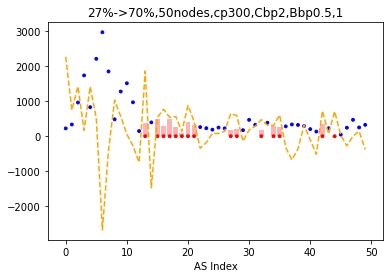

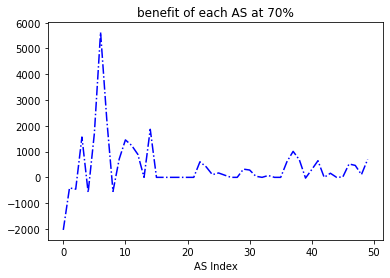

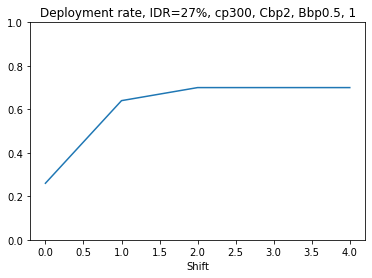

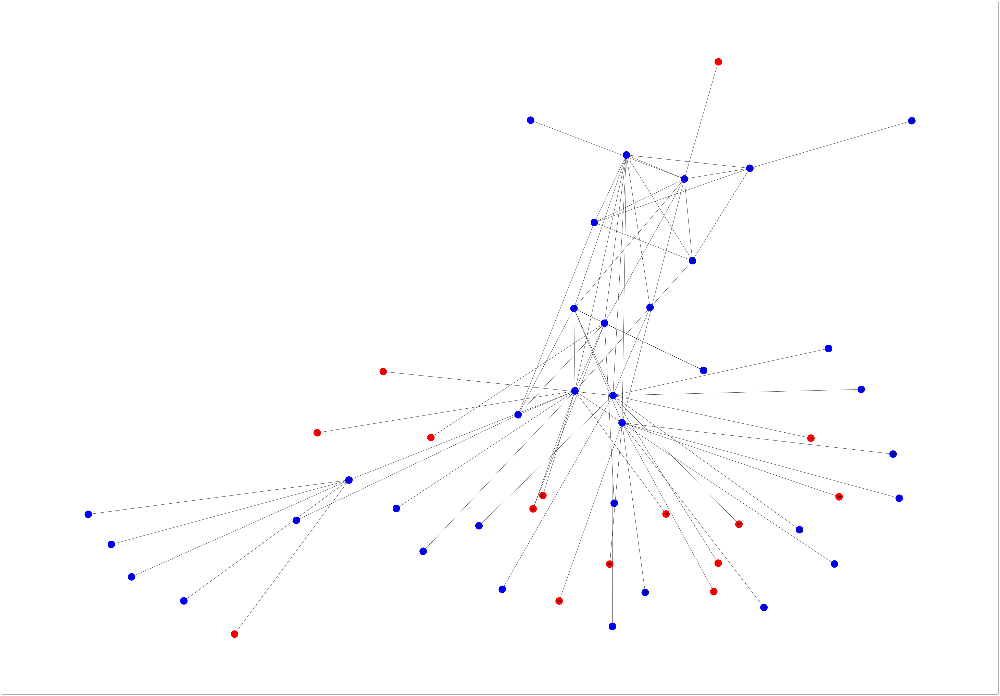

In [18]:
LetsSimulate(1,damage_list[2][1],damage_list[2][5])

ASischanged= 11
0.0 < 980.8321198565145 - 191.3573554096198
ASischanged= 12
0.0 < 772.6461281287568 - 634.7166169176966
ASischanged= 2
0.0 < 500.30091120212205 - 422.76623305082086
ASischanged= 23
0.0 < 299.40604799218426 - 115.68668908702797
ASischanged= 47
0.0 < 404.31925957898244 - 354.17010208430503
----benefit----
[0.0, 0.0, 0.0, 0.0, 485.85925463604053, 204.9352450603269, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 109.80439593075369, 0.0, 53.48953774915935, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 24.956057657381507, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
----nodepdamage----
[1727.6866988653198, 3417.052565739503, 4121.306861213617, 3062.056841430548, 4970.7139128148765, 2096.6451994633444, 2338.5254605335676, 2519.7508949551666, 1379.8444969522945, 1816.021784984974, 1639.6694186662169, -442.5289607217558, 494.1441991493697, 768.6307715152761, 620.6476782218282, 359.1440391729269, 134.50700171955353, 49

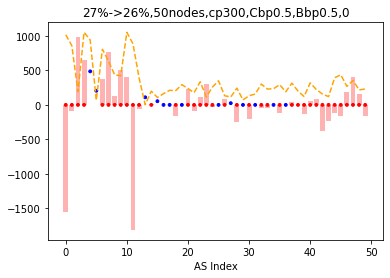

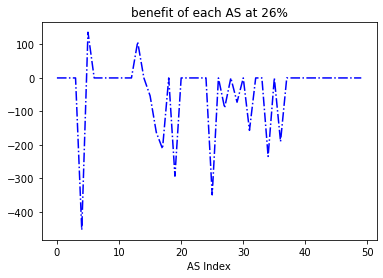

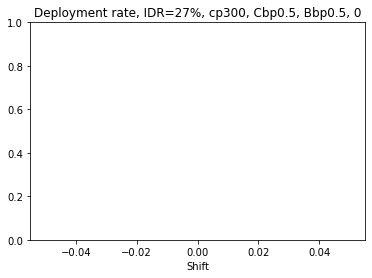

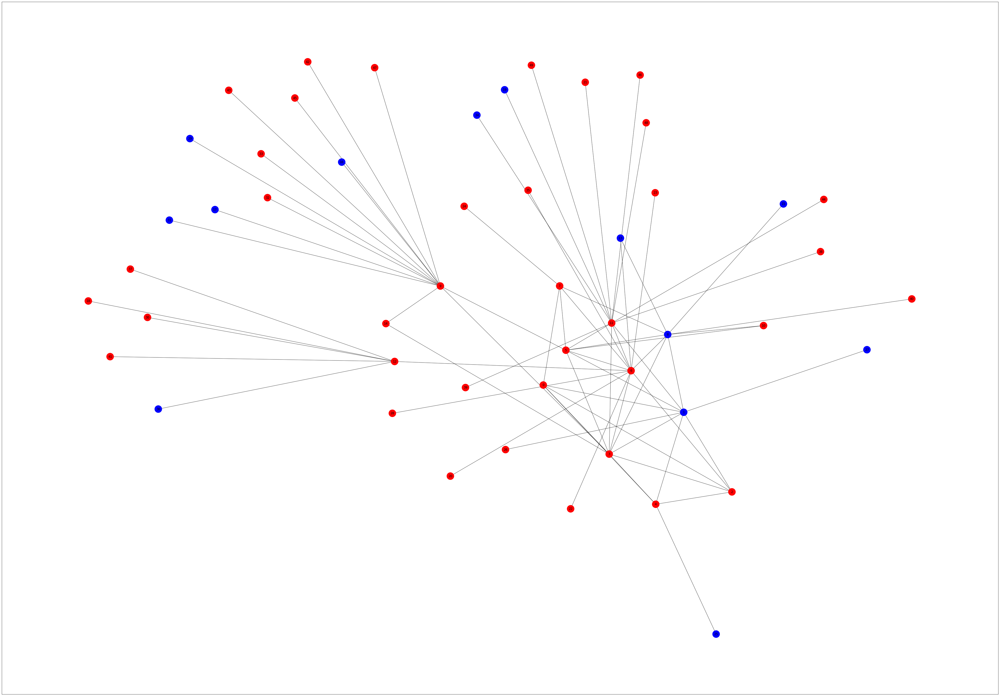

ASischanged= 3
0.0 < 1077.6909334301813 - 1052.8261871193463
ASischanged= 46
0.0 < 274.4643588422525 - 268.32232608473066
ASischanged= 48
0.0 < 246.46487393903635 - 217.0438464539677
----benefit----
[0.0, 0.0, 702.8585344705393, 0.0, 1233.3350309991802, 378.3419908806036, 0.0, 18.527580109964674, 0.0, 397.66900401130806, 0.0, 0.0, 0.0, 109.80439593075369, 0.0, 81.50786704633805, 0.0, 0.0, 0.0, 106.07155189090463, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 48.72373161679248, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 75.64346094624867, 0.0, 19.093576470567427, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
----nodepdamage----
[1727.6866988653198, 3417.052565739503, 4121.306861213617, 3062.056841430548, 4970.7139128148765, 2096.6451994633444, 2338.5254605335676, 2519.7508949551666, 1379.8444969522945, 1816.021784984974, 1639.6694186662169, -442.5289607217558, 494.1441991493697, 768.6307715152761, 620.6476782218282, 359.1440391729269, 134.50700171955353, 492.2266561955416, 140.6007117633925,

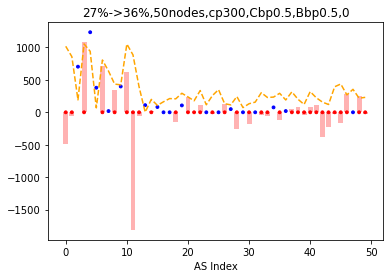

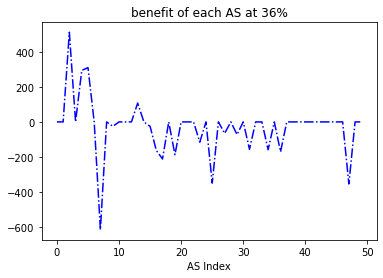

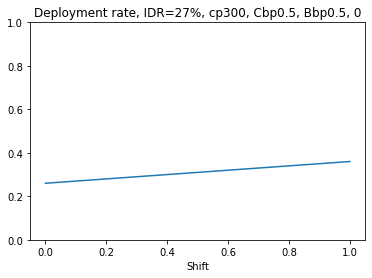

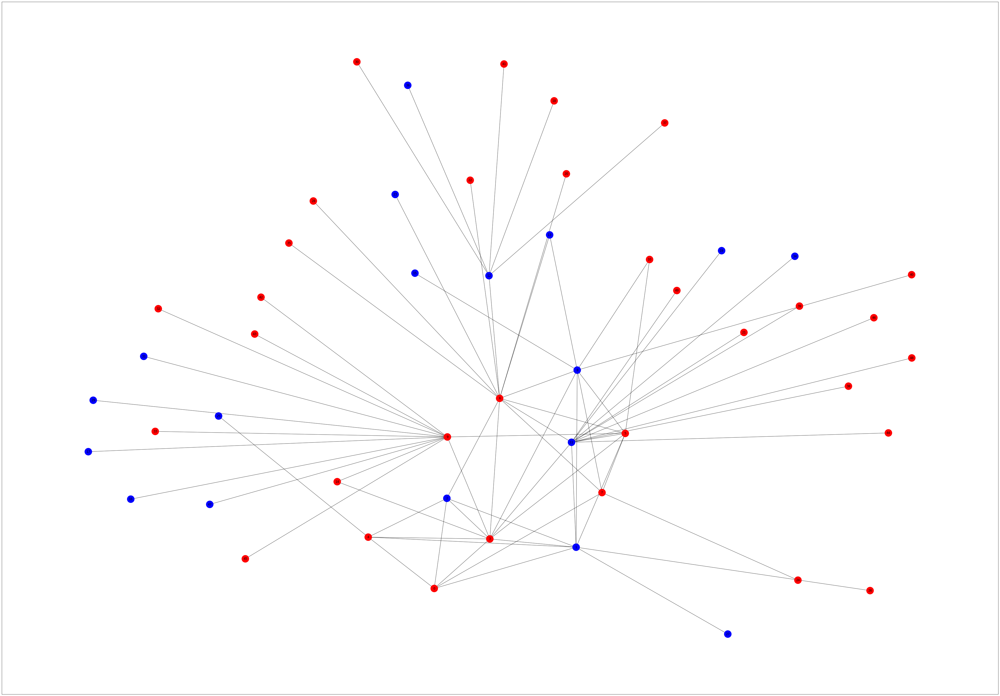

ASischanged= 9
0.0 < 1398.1759462956516 - 857.3040746810235
ASischanged= 5
0.0 < 923.5862913506976 - 805.497120146788
ASischanged= 0
0.0 < 473.9383215608228 - 434.77457917908833
ASischanged= 14
0.0 < 241.02985234349717 - 199.04951954311275
ASischanged= 26
0.0 < 148.26900578423349 - 132.59649323235377
----benefit----
[0.0, 0.0, 1086.2359169090155, 974.290813182447, 1681.8204968170635, 567.5129863209052, 0.0, 18.527580109964674, 0.0, 556.7366056158314, 0.0, 0.0, 0.0, 109.80439593075369, 0.0, 112.07331718871478, 0.0, 0.0, 0.0, 138.70895247272145, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 62.98433599243906, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 98.91837200663286, 0.0, 19.093576470567427, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 178.0707408956859, 0.0, 167.9432676328205, 0.0]
----nodepdamage----
[1727.6866988653198, 3417.052565739503, 4121.306861213617, 3062.056841430548, 4970.7139128148765, 2096.6451994633444, 2338.5254605335676, 2519.7508949551666, 1379.8444969522945, 1816.021784984974, 1639.6694186

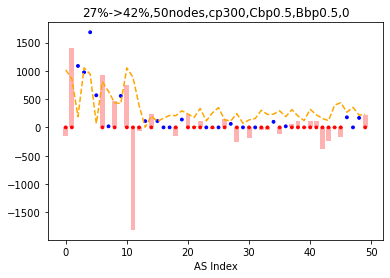

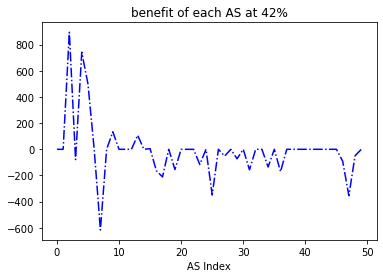

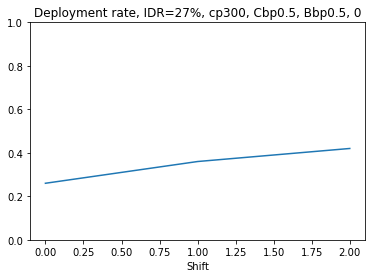

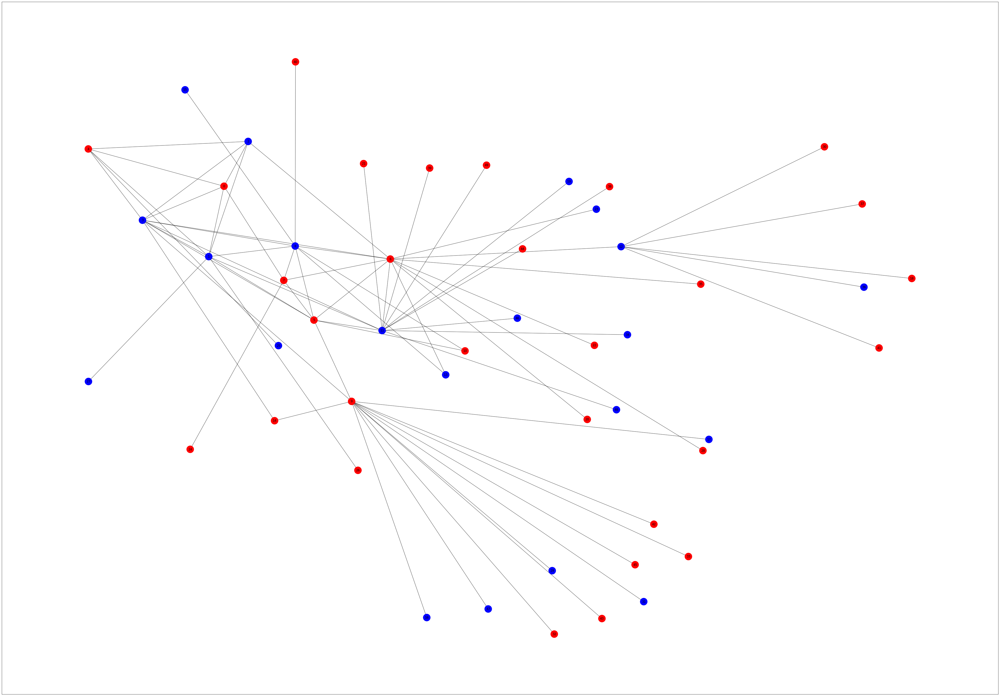

ASischanged= 4
0.0 < 1111.2241496878582 - 1051.8051832836675
ASischanged= 49
0.0 < 250.68717756788297 - 230.18823118188396
----benefit----
[0.0, 1933.6809092944475, 2172.4718338180305, 1763.0024238539518, 2952.5293166344004, 1103.49747340176, 1361.231238221032, 18.527580109964674, 825.8923266429792, 1007.428143495314, 0.0, 0.0, 0.0, 129.0201652186356, 372.38860693309687, 198.67542592544893, 81.08578117845425, 296.7323813944754, 0.0, 231.18158745453576, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 207.27040379760118, 103.3893817234377, 0.0, 240.65045709847, 0.0, 114.52842218299782, 0.0, 0.0, 164.8639533443881, 0.0, 19.093576470567427, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 296.7845681594765, 427.076715282615, 279.9054460547008, 0.0]
----nodepdamage----
[1727.6866988653198, 3417.052565739503, 4121.306861213617, 3062.056841430548, 4970.7139128148765, 2096.6451994633444, 2338.5254605335676, 2519.7508949551666, 1379.8444969522945, 1816.021784984974, 1639.6694186662169, -442.5289607217558, 494.144199

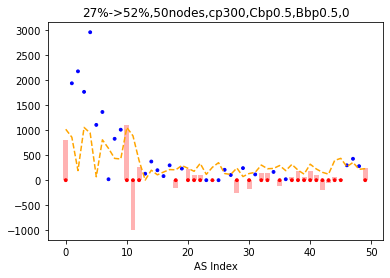

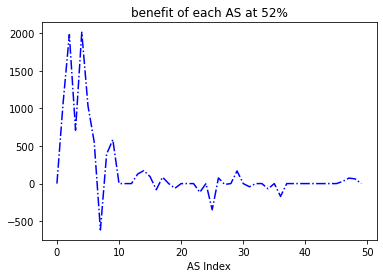

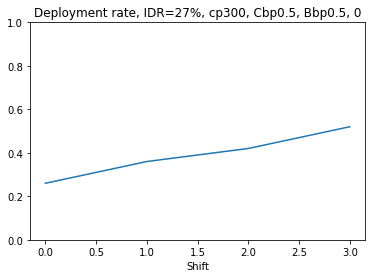

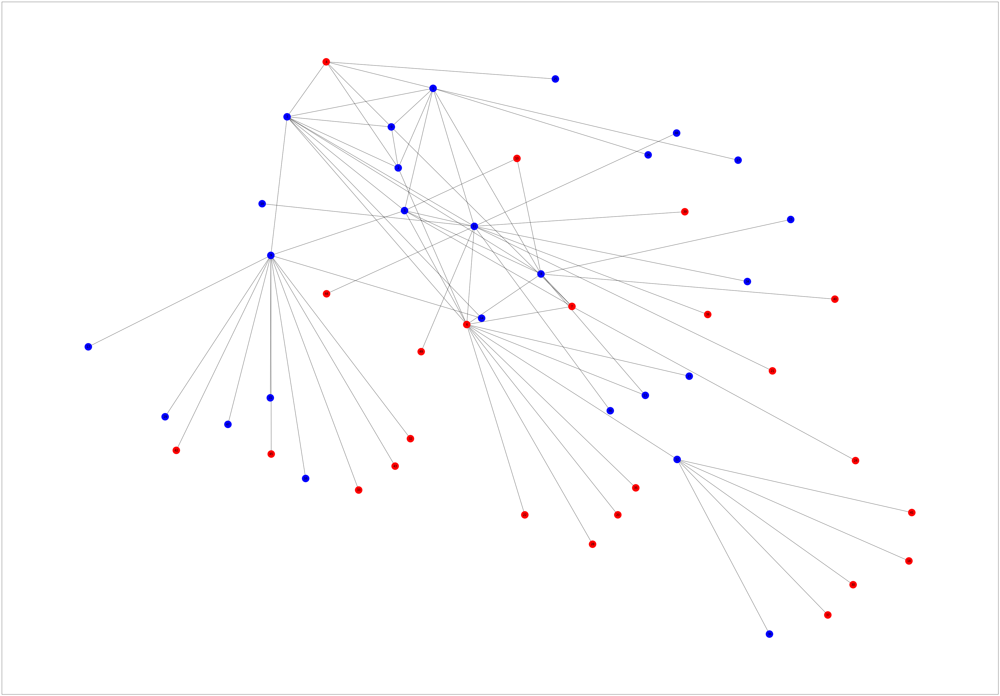

ASischanged= 6
0.0 < 1399.2830287670474 - 1016.772771247358
ASischanged= 10
0.0 < 406.699434922019 - 391.2532935566312
ASischanged= 20
0.0 < 395.8375635555859 - 236.95295558578752
ASischanged= 38
0.0 < 255.13930767257025 - 200.90179744426246
ASischanged= 39
0.0 < 132.16929099603536 - 120.74542194554719
ASischanged= 41
0.0 < 266.30804443304555 - 223.3703026521903
----benefit----
[0.0, 2119.102366350079, 2396.108640240475, 1925.3842260510264, 3214.145838361499, 1213.8472207419363, 1483.393016010099, 18.527580109964674, 896.3953301368921, 1100.2175777646194, 1065.1867026371774, 0.0, 0.0, 145.49082460824866, 403.4209908441883, 216.50527184183537, 87.76343374609166, 321.1691657446087, 0.0, 250.22007112726223, 0.0, 0.0, 0.0, 0.0, 0.0, 239.17787899791884, 223.94733283878747, 111.70806760923153, 0.0, 260.4687300359911, 0.0, 123.96017459806822, 0.0, 0.0, 178.4409847962789, 0.0, 19.093576470567427, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 321.2256502431981, 462.2477388941245, 302.95648278861

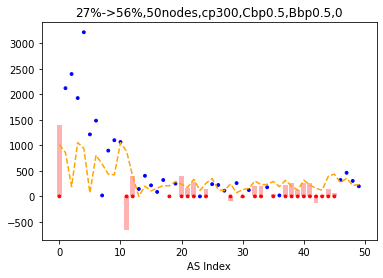

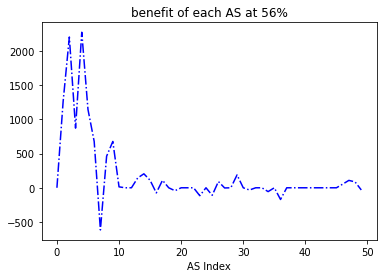

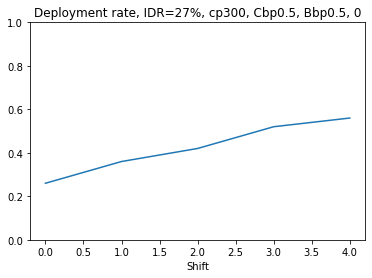

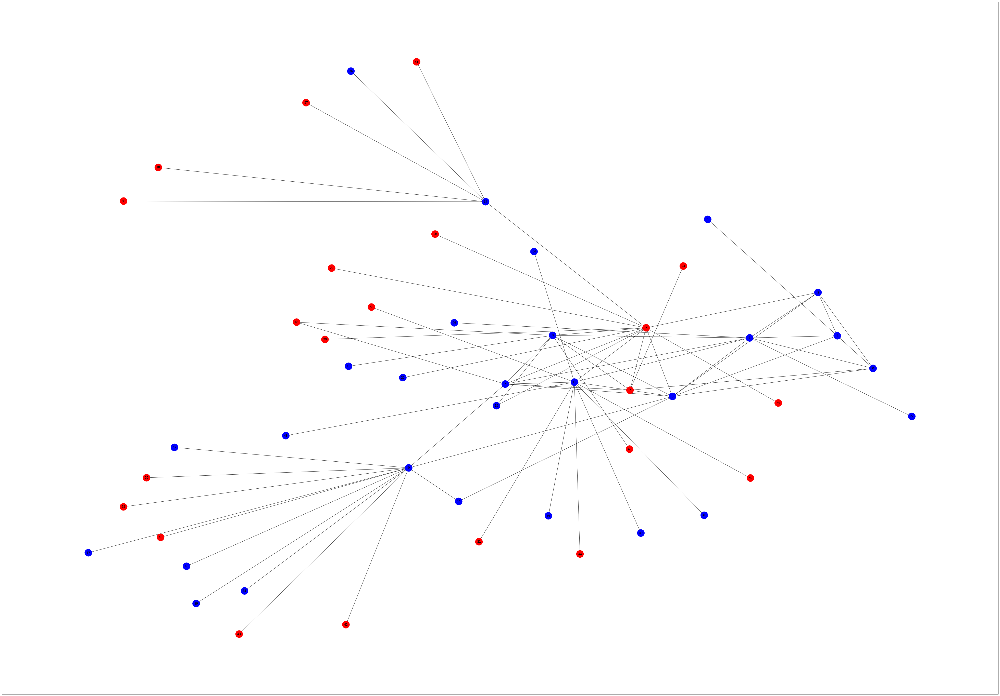

ASischanged= 21
0.0 < 200.32735678265928 - 177.18732899335984
ASischanged= 22
0.0 < 396.6548762977581 - 334.7914702707594
ASischanged= 33
0.0 < 233.74865647812283 - 228.7912939834448
ASischanged= 37
0.0 < 326.3073345230364 - 314.8920579861978
----benefit----
[1459.8282959404642, 2887.2769741519833, 3482.3445571494904, 2598.108835153192, 4223.238136451737, 1781.3602070628415, 1989.491809707662, 2149.1992927558777, 1178.4073441125436, 1550.9091156441018, 1400.3016203207837, 0.0, 423.55217069945974, 658.8263755845223, 531.9837241901384, 308.20162226896565, 115.42799438344665, 422.40727233801795, 0.0, 329.0937891999862, 457.25501888125774, 0.0, 0.0, 517.924360305922, 0.0, 311.188423212346, 288.2726305690775, 143.79442745443635, 0.0, 342.5730036342926, 0.0, 163.0345774605028, 0.0, 0.0, 234.68868652554073, 0.0, 385.05379215644325, 0.0, 258.97133579091746, 153.44387467133788, 0.0, 340.261939405684, 0.0, 0.0, 0.0, 0.0, 422.48156173290187, 607.9562652846637, 398.4536349719859, 260.9872552913525

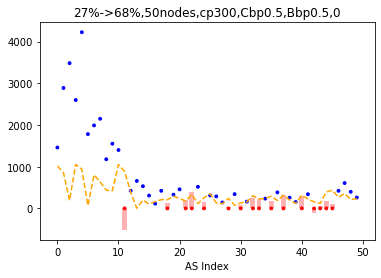

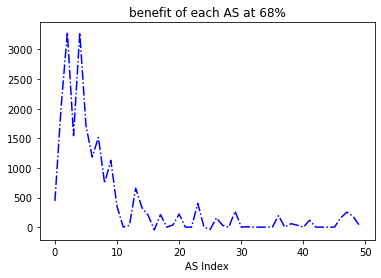

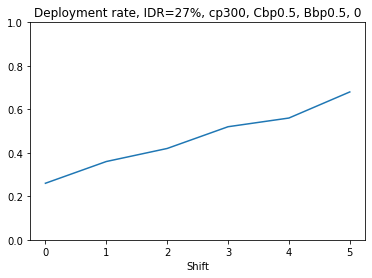

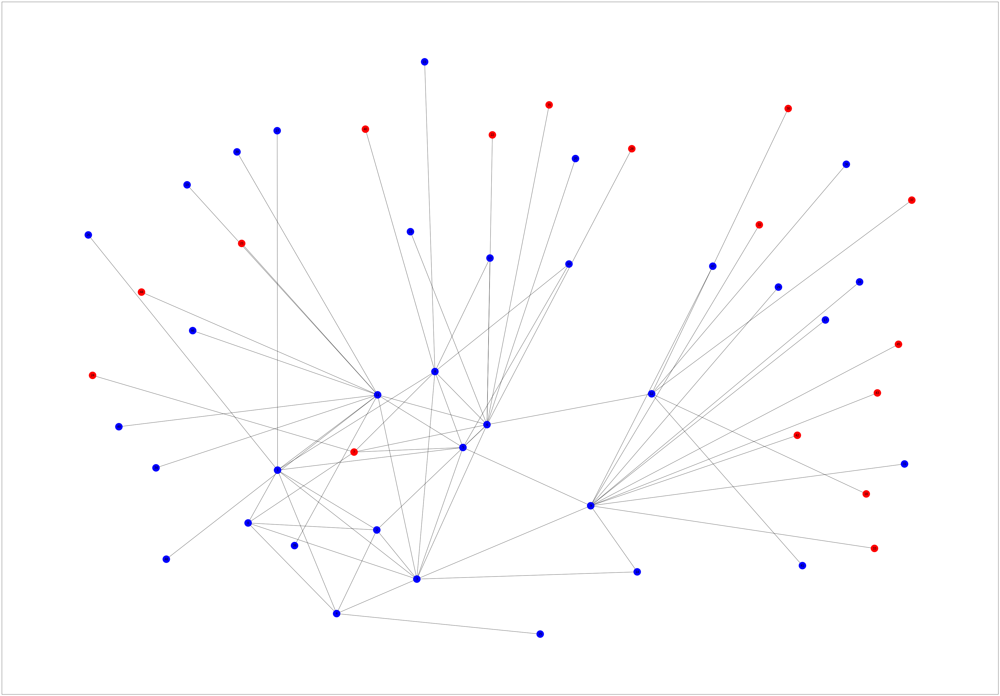

----benefit----
[1513.3999765254352, 2993.232092469487, 3610.1370179623154, 2690.8984364086637, 4372.733291724365, 1844.4172055429422, 2059.2985398728433, 2223.3096131957354, 1218.6947746804938, 1603.9316495122762, 1448.1751799898705, 0.0, 437.67057638944175, 680.7872547706731, 549.7165149964763, 318.3901056497579, 119.24379585066802, 436.37114910952266, 0.0, 339.97292272725844, 472.3708872740266, 193.96092031874505, 368.01013974702414, 535.0458267623162, 0.0, 321.475643814407, 297.80230430689824, 148.54796224631852, 0.0, 353.8977310271618, 0.0, 168.42415026911445, 0.0, 223.58973210550351, 242.4469902123355, 0.0, 397.78284313682155, 305.64529774815736, 267.5323716848321, 158.51639945386145, 0.0, 351.5102679810785, 0.0, 0.0, 0.0, 0.0, 436.4478943521714, 628.0539930626692, 411.62565596279535, 269.6149331522237]
----nodepdamage----
[1727.6866988653198, 3417.052565739503, 4121.306861213617, 3062.056841430548, 4970.7139128148765, 2096.6451994633444, 2338.5254605335676, 2519.7508949551666, 1

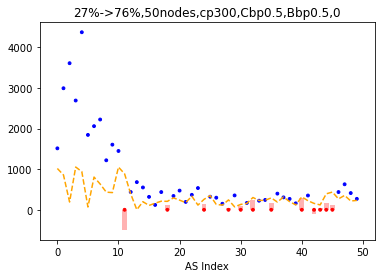

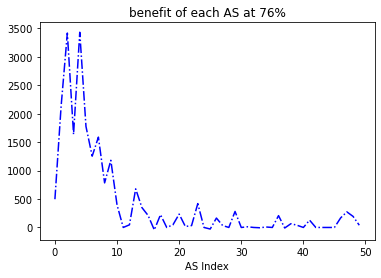

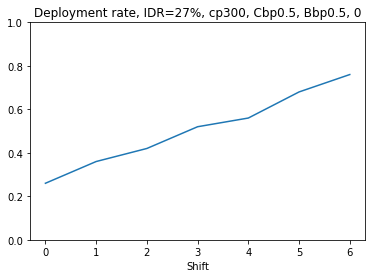

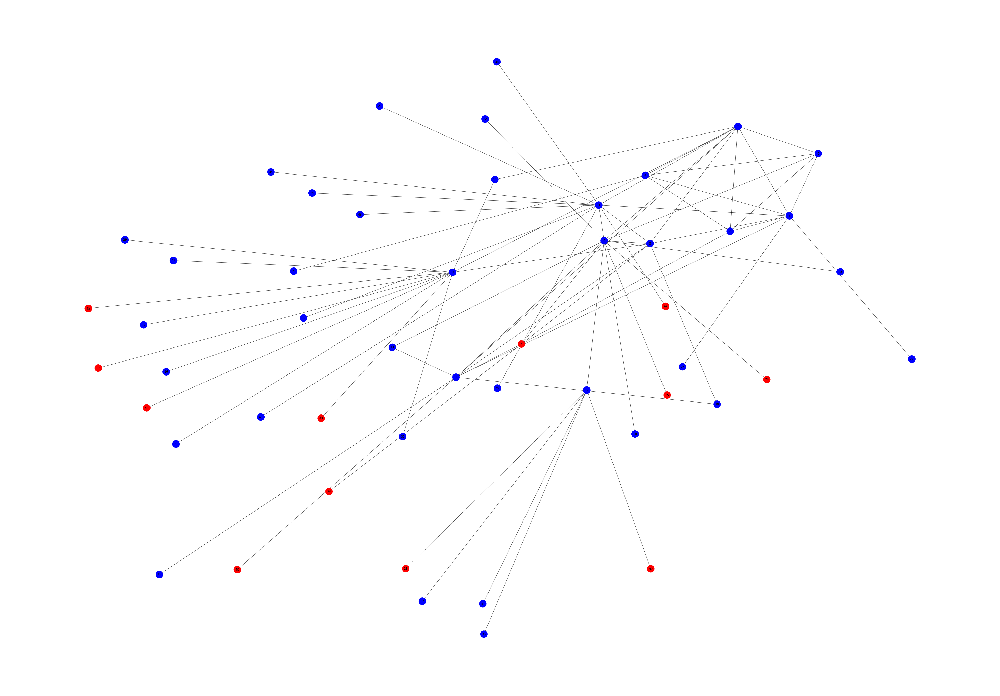

----benefit----
[1513.3999765254352, 2993.232092469487, 3610.1370179623154, 2690.8984364086637, 4372.733291724365, 1844.4172055429422, 2059.2985398728433, 2223.3096131957354, 1218.6947746804938, 1603.9316495122762, 1448.1751799898705, 0.0, 437.67057638944175, 680.7872547706731, 549.7165149964763, 318.3901056497579, 119.24379585066802, 436.37114910952266, 0.0, 339.97292272725844, 472.3708872740266, 193.96092031874505, 368.01013974702414, 535.0458267623162, 0.0, 321.475643814407, 297.80230430689824, 148.54796224631852, 0.0, 353.8977310271618, 0.0, 168.42415026911445, 0.0, 223.58973210550351, 242.4469902123355, 0.0, 397.78284313682155, 305.64529774815736, 267.5323716848321, 158.51639945386145, 0.0, 351.5102679810785, 0.0, 0.0, 0.0, 0.0, 436.4478943521714, 628.0539930626692, 411.62565596279535, 269.6149331522237]
----nodepdamage----
[1727.6866988653198, 3417.052565739503, 4121.306861213617, 3062.056841430548, 4970.7139128148765, 2096.6451994633444, 2338.5254605335676, 2519.7508949551666, 1

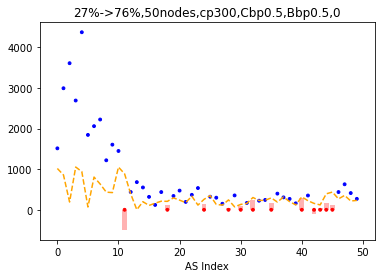

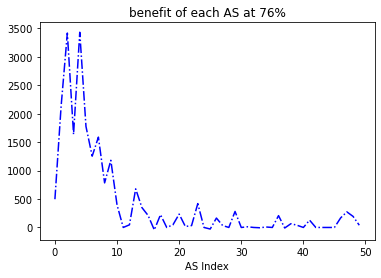

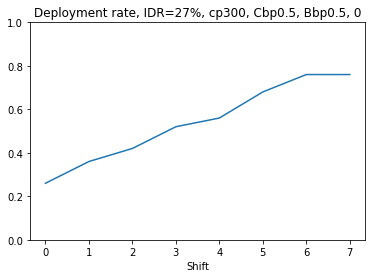

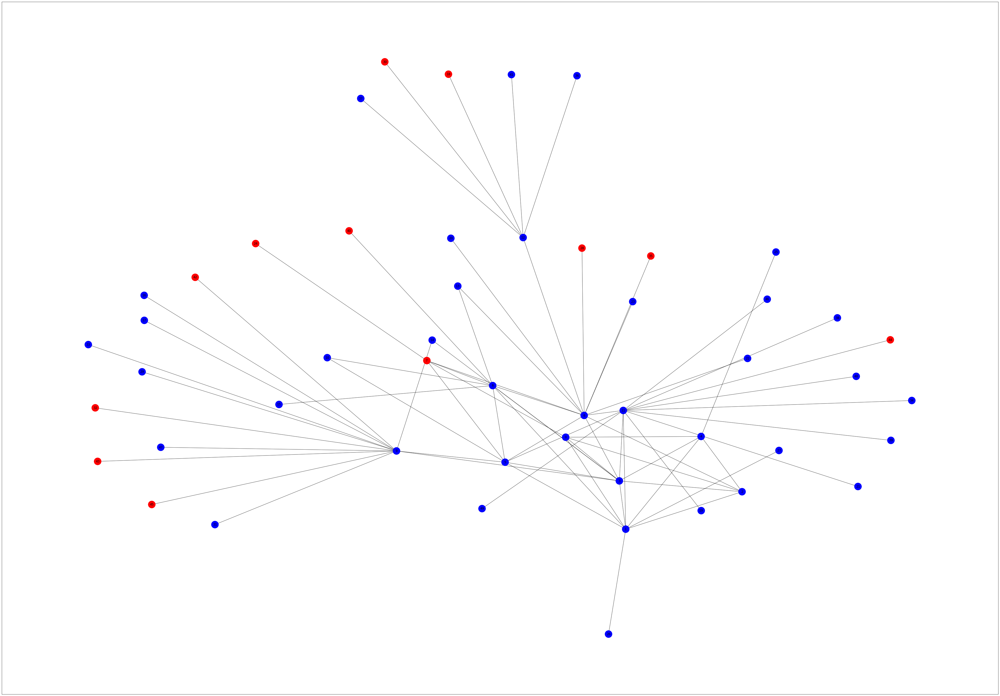

----benefit----
[1513.3999765254352, 2993.232092469487, 3610.1370179623154, 2690.8984364086637, 4372.733291724365, 1844.4172055429422, 2059.2985398728433, 2223.3096131957354, 1218.6947746804938, 1603.9316495122762, 1448.1751799898705, 0.0, 437.67057638944175, 680.7872547706731, 549.7165149964763, 318.3901056497579, 119.24379585066802, 436.37114910952266, 0.0, 339.97292272725844, 472.3708872740266, 193.96092031874505, 368.01013974702414, 535.0458267623162, 0.0, 321.475643814407, 297.80230430689824, 148.54796224631852, 0.0, 353.8977310271618, 0.0, 168.42415026911445, 0.0, 223.58973210550351, 242.4469902123355, 0.0, 397.78284313682155, 305.64529774815736, 267.5323716848321, 158.51639945386145, 0.0, 351.5102679810785, 0.0, 0.0, 0.0, 0.0, 436.4478943521714, 628.0539930626692, 411.62565596279535, 269.6149331522237]
----nodepdamage----
[1727.6866988653198, 3417.052565739503, 4121.306861213617, 3062.056841430548, 4970.7139128148765, 2096.6451994633444, 2338.5254605335676, 2519.7508949551666, 1

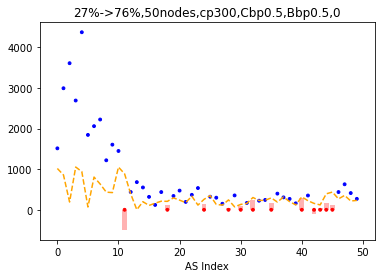

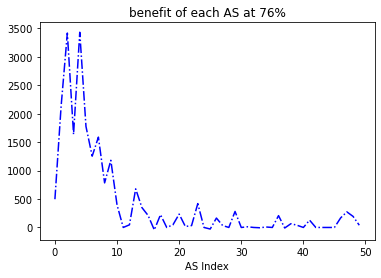

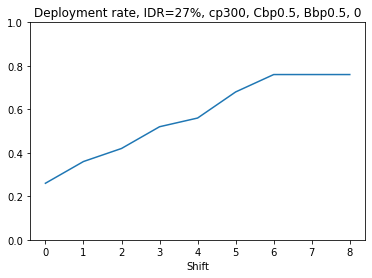

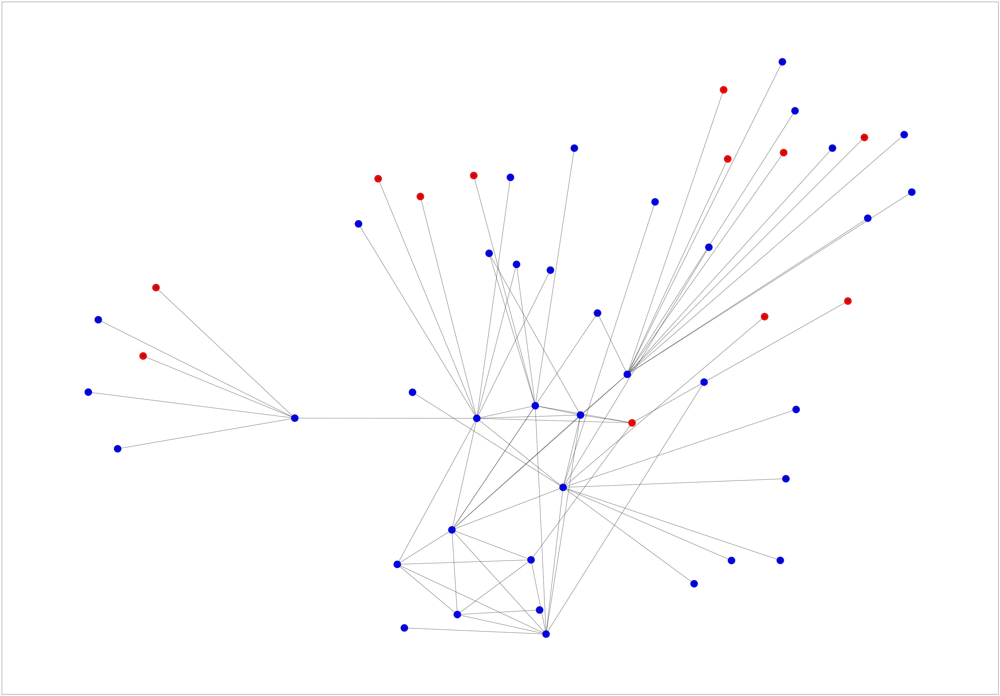

In [37]:
LetsSimulate(0,damage_list[2][0],damage_list[2][4])

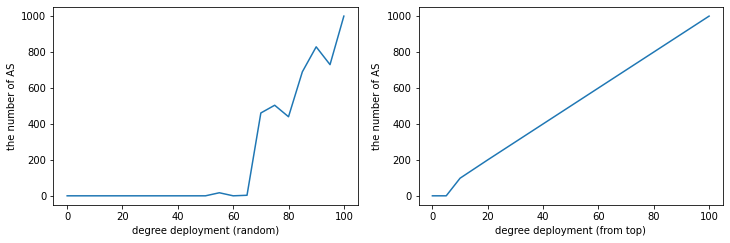

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 17, 0, 3, 461, 504, 440, 690, 829, 730, 1000] [0, 0, 98, 149, 200, 250, 300, 350, 400, 450, 500, 550, 600, 650, 700, 750, 800, 850, 900, 950, 1000]
[0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100] 21 21


In [ ]:
#plot利益獲得AS数の変化
fig = plt.figure(figsize = (12, 8))
ax0 = fig.add_subplot(221)
# plt.ylim([0,40])
ax1 = fig.add_subplot(222)
# plt.ylim([0,40])
ax0.set_xlabel('degree deployment (random)')
ax1.set_xlabel('degree deployment (from top)')
ax0.set_ylabel('the number of AS')
ax1.set_ylabel('the number of AS')
ax0.plot((5*np.arange(len(numberlist0))).tolist(),numberlist0)
ax1.plot((5*np.arange(len(numberlist1))).tolist(),numberlist1)
# fig.set_xticklabels(mylist)
# fig.savefig(str(i)+str(dep_rate)+"img.png")
# fig.savefig("D:\\保存\\導入率と利益あるAS数img.png")
plt.show()
print(numberlist0,numberlist1)
print((5*np.arange(len(numberlist0))).tolist(),len((5*np.arange(len(numberlist0))).tolist()),len(numberlist0  
))

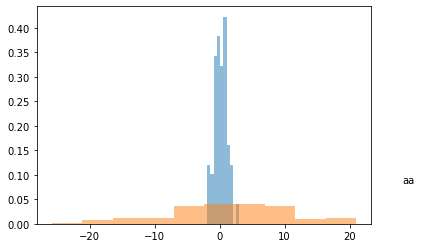

In [214]:
size_as = 1
rndlist = []
for _ in range(100):
  rnd = np.random.randn()*size_as
  rndlist.append(rnd)

plt.hist(rndlist,density=True,alpha=0.5)
size_as = 10
rndlist = []
for _ in range(100):
  rnd = np.random.randn()*size_as
  rndlist.append(rnd)
plt.text(30, 0.1, "aa", va='top', ha='right')#, transform=plt.transAxes)
plt.hist(rndlist,density=True,alpha=0.5)
plt.show()

In [101]:
os.getcwd()

'/Users/odrag0n/Desktop/Dropbox/Data file/code'